<a href="https://colab.research.google.com/github/anmol1810rs/The_Sparks_Foundation_Internship/blob/main/GRIP_TASK5_IPL_Exploratory_Data_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **GRIP_TASK5_EXPLORATORY_DATA_ANALYSIS**
  **Name : Anmol Malhotra**    

**The following submission aims at performing an ‘Exploratory Data Analysis’ on dataset ‘Indian Premier League’.**

# **PROBLEM STATEMENT:**

 **As a sports analysts, find out the most successful teams, players and factors
contributing win or loss of a team.** 

In [114]:
import numpy as np
import pandas as pd
import pylab as pl
import matplotlib.pyplot as plt
import seaborn as sns
import folium
%matplotlib inline

In [6]:
# Understanding the Match Data First
match_data = pd.read_csv('/content/drive/MyDrive/Indian Premier League.zip (Unzipped Files)/matches.csv')
match_data.head(20)

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
0,1,2017,Hyderabad,2017-04-05,Sunrisers Hyderabad,Royal Challengers Bangalore,Royal Challengers Bangalore,field,normal,0,Sunrisers Hyderabad,35,0,Yuvraj Singh,"Rajiv Gandhi International Stadium, Uppal",AY Dandekar,NJ Llong,NaN
1,2,2017,Pune,2017-04-06,Mumbai Indians,Rising Pune Supergiant,Rising Pune Supergiant,field,normal,0,Rising Pune Supergiant,0,7,SPD Smith,Maharashtra Cricket Association Stadium,A Nand Kishore,S Ravi,NaN
2,3,2017,Rajkot,2017-04-07,Gujarat Lions,Kolkata Knight Riders,Kolkata Knight Riders,field,normal,0,Kolkata Knight Riders,0,10,CA Lynn,Saurashtra Cricket Association Stadium,Nitin Menon,CK Nandan,NaN
3,4,2017,Indore,2017-04-08,Rising Pune Supergiant,Kings XI Punjab,Kings XI Punjab,field,normal,0,Kings XI Punjab,0,6,GJ Maxwell,Holkar Cricket Stadium,AK Chaudhary,C Shamshuddin,NaN
4,5,2017,Bangalore,2017-04-08,Royal Challengers Bangalore,Delhi Daredevils,Royal Challengers Bangalore,bat,normal,0,Royal Challengers Bangalore,15,0,KM Jadhav,M Chinnaswamy Stadium,NaN,NaN,NaN
5,6,2017,Hyderabad,2017-04-09,Gujarat Lions,Sunrisers Hyderabad,Sunrisers Hyderabad,field,normal,0,Sunrisers Hyderabad,0,9,Rashid Khan,"Rajiv Gandhi International Stadium, Uppal",A Deshmukh,NJ Llong,NaN
6,7,2017,Mumbai,2017-04-09,Kolkata Knight Riders,Mumbai Indians,Mumbai Indians,field,normal,0,Mumbai Indians,0,4,N Rana,Wankhede Stadium,Nitin Menon,CK Nandan,NaN
7,8,2017,Indore,2017-04-10,Royal Challengers Bangalore,Kings XI Punjab,Royal Challengers Bangalore,bat,normal,0,Kings XI Punjab,0,8,AR Patel,Holkar Cricket Stadium,AK Chaudhary,C Shamshuddin,NaN
8,9,2017,Pune,2017-04-11,Delhi Daredevils,Rising Pune Supergiant,Rising Pune Supergiant,field,normal,0,Delhi Daredevils,97,0,SV Samson,Maharashtra Cricket Association Stadium,AY Dandekar,S Ravi,NaN
9,10,2017,Mumbai,2017-04-12,Sunrisers Hyderabad,Mumbai Indians,Mumbai Indians,field,normal,0,Mumbai Indians,0,4,JJ Bumrah,Wankhede Stadium,Nitin Menon,CK Nandan,NaN


In [7]:
match_data.tail()

,id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
751,11347,2019,Mumbai,05/05/19,Kolkata Knight Riders,Mumbai Indians,Mumbai Indians,field,normal,0,Mumbai Indians,0,9,HH Pandya,Wankhede Stadium,Nanda Kishore,O Nandan,S Ravi
752,11412,2019,Chennai,07/05/19,Chennai Super Kings,Mumbai Indians,Chennai Super Kings,bat,normal,0,Mumbai Indians,0,6,AS Yadav,M. A. Chidambaram Stadium,Nigel Llong,Nitin Menon,Ian Gould
753,11413,2019,Visakhapatnam,08/05/19,Sunrisers Hyderabad,Delhi Capitals,Delhi Capitals,field,normal,0,Delhi Capitals,0,2,RR Pant,ACA-VDCA Stadium,NaN,NaN,NaN
754,11414,2019,Visakhapatnam,10/05/19,Delhi Capitals,Chennai Super Kings,Chennai Super Kings,field,normal,0,Chennai Super Kings,0,6,F du Plessis,ACA-VDCA Stadium,Sundaram Ravi,Bruce Oxenford,Chettithody Shamshuddin
755,11415,2019,Hyderabad,12/05/19,Mumbai Indians,Chennai Super Kings,Mumbai Indians,bat,normal,0,Mumbai Indians,1,0,JJ Bumrah,Rajiv Gandhi Intl. Cricket Stadium,Nitin Menon,Ian Gould,Nigel Llong


In [8]:
# The number of rows and columns of the given dataset
match_data.shape

(756, 18)

In [9]:
# Describes only the numeric values
match_data.describe()

,id,season,dl_applied,win_by_runs,win_by_wickets
count,756.000000,756.000000,756.000000,756.000000,756.000000
mean,1792.178571,2013.444444,0.025132,13.283069,3.350529
std,3464.478148,3.366895,0.156630,23.471144,3.387963
min,1.000000,2008.000000,0.000000,0.000000,0.000000
25%,189.750000,2011.000000,0.000000,0.000000,0.000000
50%,378.500000,2013.000000,0.000000,0.000000,4.000000
75%,567.250000,2016.000000,0.000000,19.000000,6.000000
max,11415.000000,2019.000000,1.000000,146.000000,10.000000


In [11]:
match_data.columns

Index(['id', 'season', 'city', 'date', 'team1', 'team2', 'toss_winner',
       'toss_decision', 'result', 'dl_applied', 'winner', 'win_by_runs',
       'win_by_wickets', 'player_of_match', 'venue', 'umpire1', 'umpire2',
       'umpire3'],
      dtype='object')

In [13]:
match_data.nunique()

id                 756
season              12
city                32
date               546
team1               15
team2               15
toss_winner         15
toss_decision        2
result               3
dl_applied           2
winner              15
win_by_runs         89
win_by_wickets      11
player_of_match    226
venue               41
umpire1             61
umpire2             65
umpire3             25
dtype: int64

In [14]:
match_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 756 entries, 0 to 755
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               756 non-null    int64 
 1   season           756 non-null    int64 
 2   city             749 non-null    object
 3   date             756 non-null    object
 4   team1            756 non-null    object
 5   team2            756 non-null    object
 6   toss_winner      756 non-null    object
 7   toss_decision    756 non-null    object
 8   result           756 non-null    object
 9   dl_applied       756 non-null    int64 
 10  winner           752 non-null    object
 11  win_by_runs      756 non-null    int64 
 12  win_by_wickets   756 non-null    int64 
 13  player_of_match  752 non-null    object
 14  venue            756 non-null    object
 15  umpire1          754 non-null    object
 16  umpire2          754 non-null    object
 17  umpire3          119 non-null    ob

In [18]:
match_data.isnull().sum()

id                   0
season               0
city                 7
date                 0
team1                0
team2                0
toss_winner          0
toss_decision        0
result               0
dl_applied           0
winner               4
win_by_runs          0
win_by_wickets       0
player_of_match      4
venue                0
umpire1              2
umpire2              2
umpire3            637
dtype: int64

In [19]:
#We remove the umpire 3 as it has a large number of NULL values, whuich we won't require in EDA
match_data = match_data.drop(['umpire3'],axis=1)

In [22]:
# Checking if umpire 3 has been dropped or not 
match_data.isnull().sum()

id                 0
season             0
city               7
date               0
team1              0
team2              0
toss_winner        0
toss_decision      0
result             0
dl_applied         0
winner             4
win_by_runs        0
win_by_wickets     0
player_of_match    4
venue              0
umpire1            2
umpire2            2
dtype: int64

In [33]:
#tells us that maximum matches have been played in the year 2013
match_data['season'].value_counts()


2013    76
2012    74
2011    73
2019    60
2018    60
2016    60
2014    60
2010    60
2017    59
2015    59
2008    58
2009    57
Name: season, dtype: int64

In [34]:
# Mumbai is the city where maximum matches have been played
match_data['city'].value_counts()

Mumbai            101
Kolkata            77
Delhi              74
Bangalore          66
Hyderabad          64
Chennai            57
Jaipur             47
Chandigarh         46
Pune               38
Durban             15
Bengaluru          14
Visakhapatnam      13
Centurion          12
Ahmedabad          12
Rajkot             10
Mohali             10
Indore              9
Dharamsala          9
Johannesburg        8
Cuttack             7
Cape Town           7
Port Elizabeth      7
Ranchi              7
Abu Dhabi           7
Sharjah             6
Raipur              6
Kochi               5
Kanpur              4
Kimberley           3
East London         3
Nagpur              3
Bloemfontein        2
Name: city, dtype: int64

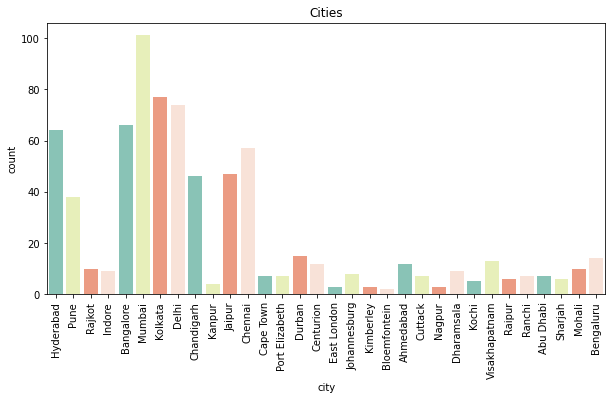

In [40]:
plt.figure(figsize = (10,5))
sns.countplot(x = 'city', data = match_data, palette= ["#7fcdbb","#edf8b1","#fc9272", "#fee0d2"])
plt.title('Cities')
plt.xticks(rotation = 90);

## ***Mumbai is the city with maximum number of matches played***

In [41]:
match_data['winner'].value_counts()

Mumbai Indians                 109
Chennai Super Kings            100
Kolkata Knight Riders           92
Royal Challengers Bangalore     84
Kings XI Punjab                 82
Rajasthan Royals                75
Delhi Daredevils                67
Sunrisers Hyderabad             58
Deccan Chargers                 29
Gujarat Lions                   13
Pune Warriors                   12
Delhi Capitals                  10
Rising Pune Supergiant          10
Kochi Tuskers Kerala             6
Rising Pune Supergiants          5
Name: winner, dtype: int64

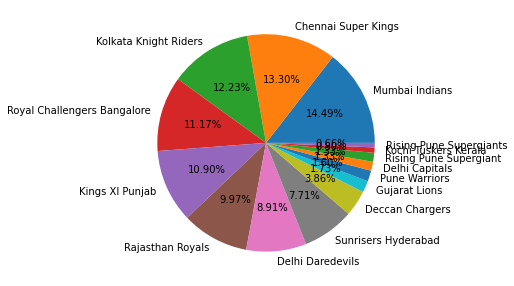

In [50]:
plt.figure(figsize=(10,5))
plt.pie(list(match_data['winner'].value_counts()),labels = list(match_data['winner'].value_counts().keys()), autopct = '%0.2f%%')
plt.show()

**Mumbai Indians** have been the ***Winners*** (maximum times) across all the  12 IPL Seasons 

In [52]:
match_data['win_by_runs'].value_counts()[0:5]

0     419
14     13
4      11
10     11
1      10
Name: win_by_runs, dtype: int64

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


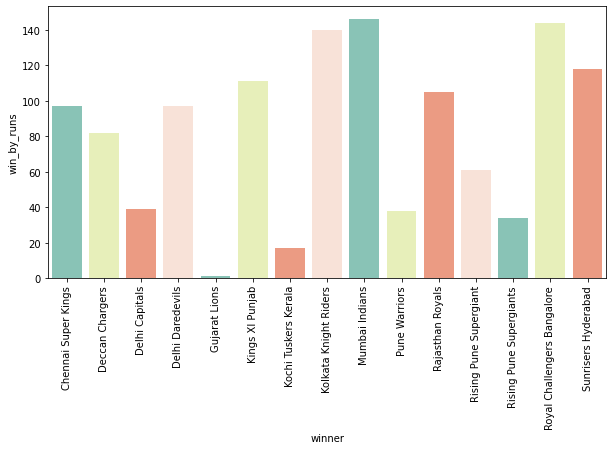

In [56]:
max_winner=match_data.groupby(['winner'],as_index=False)['win_by_runs'].max()
plt.subplots(figsize=(10,5))
plt.xticks(rotation=90)
sns.barplot(max_winner['winner'],max_winner['win_by_runs'], palette= ["#7fcdbb","#edf8b1","#fc9272", "#fee0d2"])

**Mumbai Indians** have won the maximum number of matches in terms of **'Win_By_Runs'**

In [59]:
match_data['player_of_match'].value_counts()[0:10]

CH Gayle          21
AB de Villiers    20
MS Dhoni          17
DA Warner         17
RG Sharma         17
YK Pathan         16
SR Watson         15
SK Raina          14
G Gambhir         13
AM Rahane         12
Name: player_of_match, dtype: int64

(array([0, 1, 2, 3, 4]), <a list of 5 Text major ticklabel objects>)

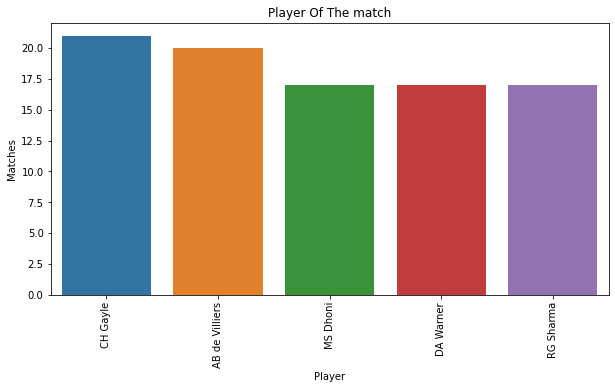

In [70]:
plt.figure(figsize = (10,5))
sns.barplot(x= match_data['player_of_match'].value_counts()[:5].index, y= match_data['player_of_match'].value_counts()[:5])
plt.title('Player Of The match')
plt.xlabel('Player')
plt.ylabel('Matches')
plt.xticks(rotation = 90)

**Chris Gayle** has been the '**Player Of The Match**' maximum times

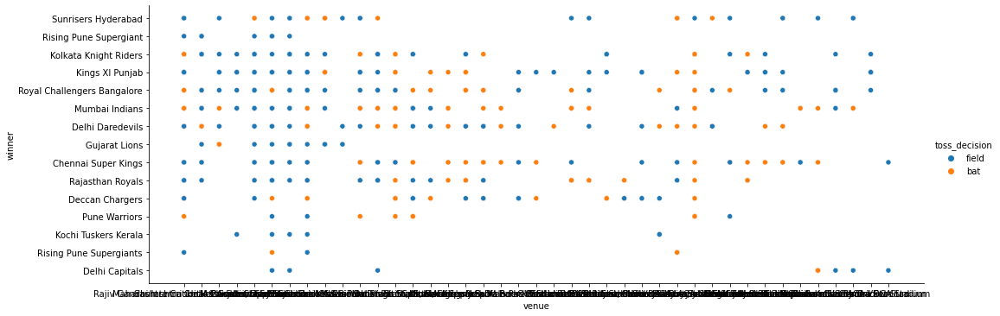

In [102]:
vals  = sns.relplot(x ='venue', y = 'winner', hue ='toss_decision', data = match_data, height =5, aspect=3)


**The above graph highlights which team decided to bat or field with respect to their toss decision on a given venue of a city.**

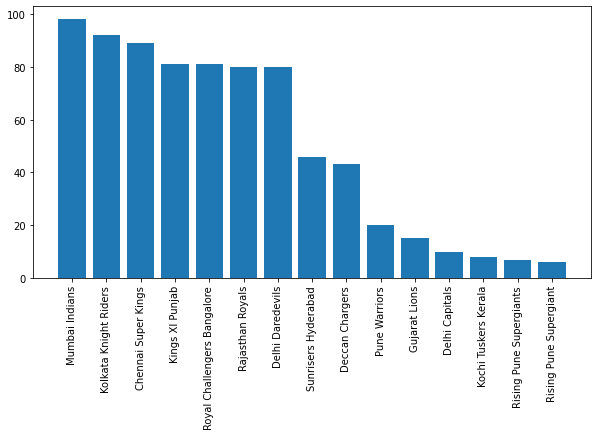

In [105]:

plt.figure(figsize=(10,5))
plt.bar(list(match_data['toss_winner'].value_counts().keys()),list(match_data['toss_winner'].value_counts()))
plt.xticks(rotation = 90)
plt.show()

the **Toss Winners** of the respective matches

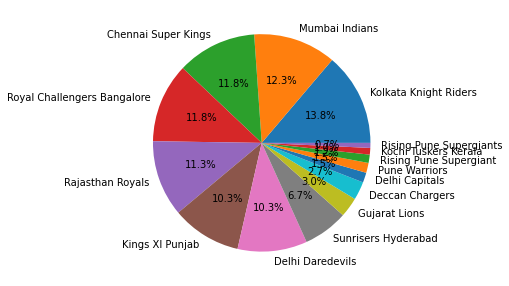

In [108]:
bat_second_innings = match_data[match_data['win_by_wickets']!=0]
plt.figure(figsize = (10,5))
plt.pie(list(bat_second_innings['winner'].value_counts()), labels=list(bat_second_innings['winner'].value_counts().keys())
        ,autopct = '%0.1f%%')
plt.show()

**Teams** winning on the **2nd Position**

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40]),
 <a list of 41 Text major ticklabel objects>)

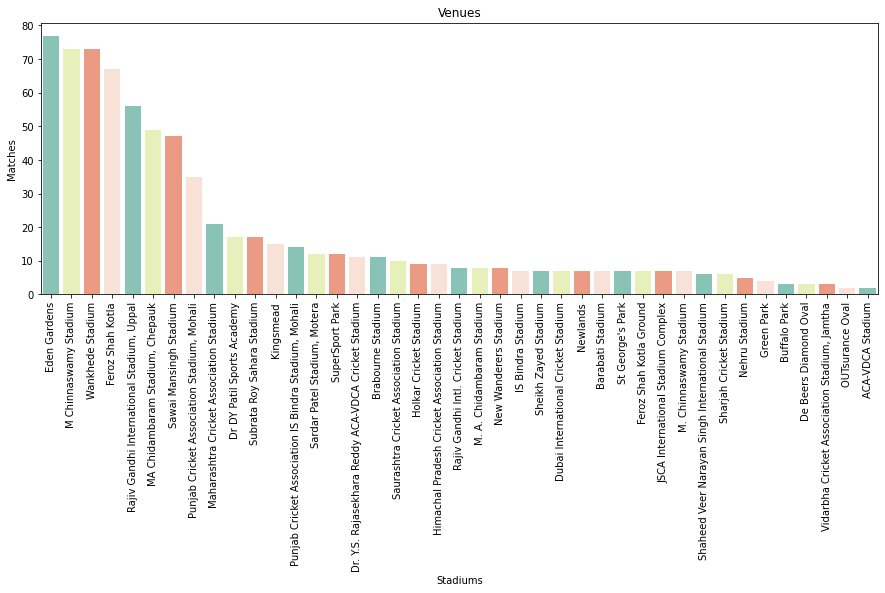

In [112]:
plt.subplots(figsize=(15,5))
sns.countplot(x ='venue',data = match_data,order = match_data['venue'].value_counts().index, palette= ["#7fcdbb","#edf8b1","#fc9272", "#fee0d2"])
plt.title('Venues')
plt.xlabel('Stadiums')
plt.ylabel('Matches')
plt.xticks(rotation = 90)

***Eden Gardens***, Kolkata is the most popular venue

In [131]:
# Define a dictionary containing Students data 
data = {'Venue': ['Eden Gardens', 'Wankhede', 'Feroz Shah Kotla ','M Chinnaswamy Stadium', 'Rajiv Gandhi Intl. Stadium'], 
        'location': ['Kolkata','Mumbai', 'Delhi','Chennai','hyderabad'], 
        'X': [22.56,18.94,28.69,12.98,17.41], 'Y':[88.34,72.82,77.24,77.59,78.55]} 
  
# Convert the dictionary into DataFrame 
locations = pd.DataFrame(data) 
print(locations)



                        Venue   location      X      Y
0                Eden Gardens    Kolkata  22.56  88.34
1                    Wankhede     Mumbai  18.94  72.82
2           Feroz Shah Kotla       Delhi  28.69  77.24
3       M Chinnaswamy Stadium    Chennai  12.98  77.59
4  Rajiv Gandhi Intl. Stadium  hyderabad  17.41  78.55


In [135]:
#Creating simple map
marker=folium.Map(location=[28.704060,77.102493], zoom_start=4)

In [145]:
# India latitude and longitude values
latitude = 28.70406
longitude = 77.102493

# get the first 5 locations in the df_incidents dataframe
limit = 5
locations = locations.iloc[0:limit, :]

# instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the 5 stadiums and add each to the incidents feature group
for lat, lng, in zip(locations.X, locations.Y):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        )
    )

# add incidents to map
marker.add_child(incidents)

In [146]:
data=pd.read_csv("stadium.csv" ,encoding = "cp1252")
lat=list(data["LAT"])
lon=list(data["LON"])
name=list(data["NAME"])
capacity=list(data["capacity"])
website=list(data["website"])
picture=list(data["picture"])

map=folium.Map(location=[23.379379735000043,79.44332654800007],zoom_start=5)

fg=folium.FeatureGroup(name="my map")


for lt,ln,nm,cp,ws,pic in zip(lat,lon,name,capacity,website,picture):
    fg.add_child(folium.Marker(location=[lt,ln],popup="<b>name  : </b>"+nm+ "<br> <b>capacity : </b> "+str(cp)+"<br><b>wikipidea link: </b><a href="+ws+">click here</a>"+"<br> <img src="+pic+" height=142 width=290>",icon=folium.Icon(color='green')))
fg.add_child(folium.GeoJson(data=(open('india_states.json','r',encoding='utf-8-sig').read())))

map.add_child(fg)



# **Analysis Of Deliveries Dataset**

In [149]:
deliveries_data= pd.read_csv('/content/drive/MyDrive/Indian Premier League.zip (Unzipped Files)/deliveries.csv')
deliveries_data.head(7)

,match_id,inning,batting_team,bowling_team,over,ball,batsman,non_striker,bowler,is_super_over,wide_runs,bye_runs,legbye_runs,noball_runs,penalty_runs,batsman_runs,extra_runs,total_runs,player_dismissed,dismissal_kind,fielder
0,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,1,DA Warner,S Dhawan,TS Mills,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
1,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,2,DA Warner,S Dhawan,TS Mills,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
2,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,3,DA Warner,S Dhawan,TS Mills,0,0,0,0,0,0,4,0,4,NaN,NaN,NaN
3,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,4,DA Warner,S Dhawan,TS Mills,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
4,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,5,DA Warner,S Dhawan,TS Mills,0,2,0,0,0,0,0,2,2,NaN,NaN,NaN
5,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,6,S Dhawan,DA Warner,TS Mills,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN
6,1,1,Sunrisers Hyderabad,Royal Challengers Bangalore,1,7,S Dhawan,DA Warner,TS Mills,0,0,0,1,0,0,0,1,1,NaN,NaN,NaN


In [151]:
# The Total no of rows and columns in deliveries_data 
deliveries_data.shape

(179078, 21)

In [154]:
# Total matches where the tie led to a superover
deliveries_data['is_super_over'].value_counts()

0    178997
1        81
Name: is_super_over, dtype: int64

In [155]:
# net runs obtained from  no balls
sum(deliveries_data['noball_runs'])

749

In [157]:
# Net runs obtained from  penalty
sum(deliveries_data['penalty_runs'])

10

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 <a list of 9 Text major ticklabel objects>)

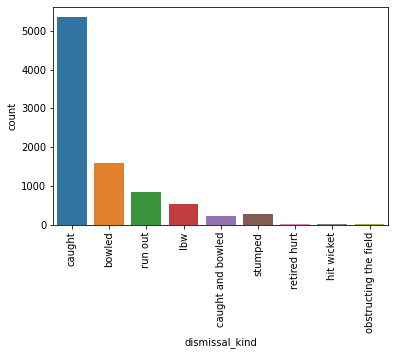

In [159]:
# kinds of dismissal
sns.countplot(x = deliveries_data['dismissal_kind'], data = deliveries_data)
plt.xticks(rotation = 90)

# **The Following results were obtained from the EDA over the IPL match Datasets**

---> **Mumbai Indians** have emerged as Winners, the maximum number of times.

---> **Eden gardens** is the stadium where maximum matches have been played.

---> **Chris Gayle** has been the Player of The Match , maximum times.

---> There are many other factors that proved instrumental in Data Analysis     including **venue, city, toss_decision** etc..  